# <div style = 'background-color:pink'> <center> <font color='darkblue'>**SAMRADDHI_DSFT8_CLASSIFICATION_PROJECT**</font></div>

# <div style = 'background-color:pink'> <center> <font color='darkblue'>Project Discription
    Property buyers have different requirements. To facilitate this, real estate companies prefer categorizing various houses into different grades based on various parameters. This would help agents in identifying the type of house a customer is looking for. This way, the search for the house can be narrowed down by focusing only on the ‘condition of the house’.The Grade (condition of the house that ranges from A(Best)  -E(Worst) ) can also be used by existing owners to list their properties for sale. Grading helps them in arriving at a price of the house.


# <div style = 'background-color:pink'> <center> <font color='darkblue'>Business Objective
   
    Build a predictive model to determine the Grade of house (grades are A,B,C,D,and E)

In [1]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import pyplot
from numpy import mean
from numpy import std

import warnings
warnings.filterwarnings("ignore")

# evaluation imports
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# plotting libraries
import matplotlib.pyplot as plt
import seaborn as sb

In [2]:
df = pd.read_csv("DS3_C6_S2_Classification_HouseGrade_Data_Project.csv")

In [3]:
df

,Id,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,roof,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price,Grade
0,1,339,6,5,4,6,NO,0,76,2,79,6,3481,D
1,2,358,5,4,3,4,YES,71,96,3,72,4,3510,D
2,3,324,7,5,4,5,YES,101,117,5,64,3,3748,C
3,4,330,6,4,3,5,YES,101,82,2,59,2,3134,D
4,5,320,7,4,4,5,NO,0,75,3,40,1,3843,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,2996,341,9,6,5,7,YES,95,115,5,90,2,4246,B
2996,2997,292,9,8,7,8,YES,116,87,7,97,4,3753,A
2997,2998,328,7,4,3,5,NO,0,78,5,95,6,3607,D
2998,2999,293,9,7,7,8,NO,0,78,7,51,3,4198,B


In [4]:
df.info

<bound method DataFrame.info of         Id  Area(total)  Trooms  Nbedrooms  Nbwashrooms  Twashrooms roof  \
0        1          339       6          5            4           6   NO   
1        2          358       5          4            3           4  YES   
2        3          324       7          5            4           5  YES   
3        4          330       6          4            3           5  YES   
4        5          320       7          4            4           5   NO   
...    ...          ...     ...        ...          ...         ...  ...   
2995  2996          341       9          6            5           7  YES   
2996  2997          292       9          8            7           8  YES   
2997  2998          328       7          4            3           5   NO   
2998  2999          293       9          7            7           8   NO   
2999  3000          343       7          6            6           8   NO   

      Roof(Area)  Lawn(Area)  Nfloors  API  ANB  Expect

In [5]:
df.dtypes

Id                 int64
Area(total)        int64
Trooms             int64
Nbedrooms          int64
Nbwashrooms        int64
Twashrooms         int64
roof              object
Roof(Area)         int64
Lawn(Area)         int64
Nfloors            int64
API                int64
ANB                int64
Expected price     int64
Grade             object
dtype: object

In [6]:
df.describe()

,Id,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.00000,3000.000000
mean,1500.500000,325.117000,7.021667,5.023000,4.513667,6.010667,48.980667,95.609333,4.013333,70.190667,3.47900,3782.938333
std,866.169729,20.507742,1.421221,1.634838,1.715263,1.786136,48.746641,14.837388,1.621532,17.563460,1.69426,567.189995
min,1.000000,290.000000,5.000000,2.000000,1.000000,2.000000,0.000000,70.000000,1.000000,40.000000,1.00000,2504.000000
25%,750.750000,308.000000,6.000000,4.000000,3.000000,5.000000,0.000000,83.000000,3.000000,55.000000,2.00000,3354.000000
50%,1500.500000,325.000000,7.000000,5.000000,4.000000,6.000000,71.000000,96.000000,4.000000,70.000000,4.00000,3771.000000
75%,2250.250000,343.000000,8.000000,6.000000,6.000000,7.000000,96.000000,109.000000,5.000000,85.000000,5.00000,4208.000000
max,3000.000000,360.000000,9.000000,8.000000,8.000000,10.000000,120.000000,120.000000,7.000000,100.000000,6.00000,5216.000000


In [7]:
df.isnull().sum()

Id                0
Area(total)       0
Trooms            0
Nbedrooms         0
Nbwashrooms       0
Twashrooms        0
roof              0
Roof(Area)        0
Lawn(Area)        0
Nfloors           0
API               0
ANB               0
Expected price    0
Grade             0
dtype: int64

In [8]:
from pandas_profiling import ProfileReport

In [9]:
profile = ProfileReport(df, title="Pandas Profiling Report")

In [10]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# EDA using Klib Library

In [11]:
import klib

<AxesSubplot:xlabel='Expected price', ylabel='Density'>

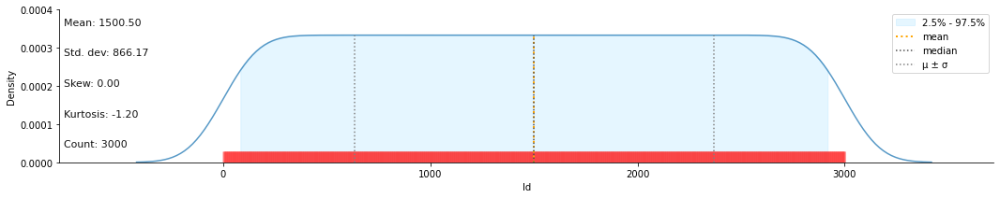

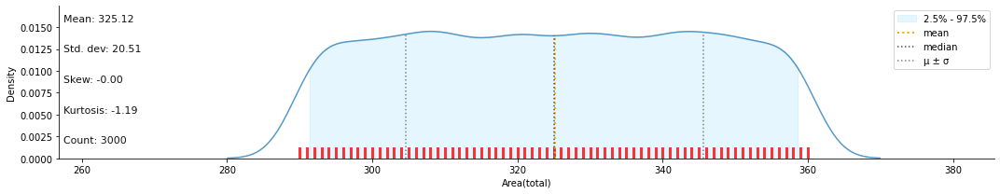

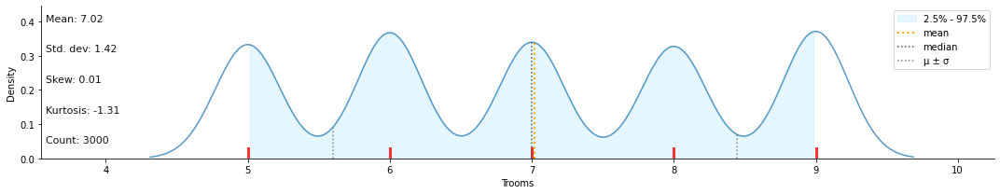

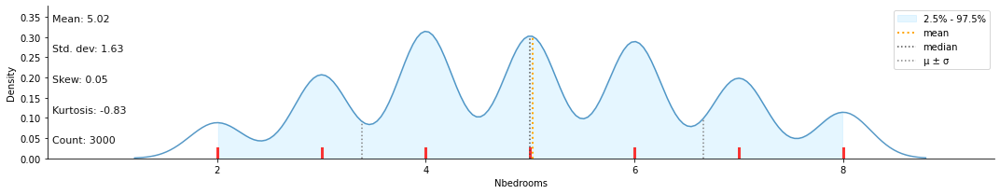

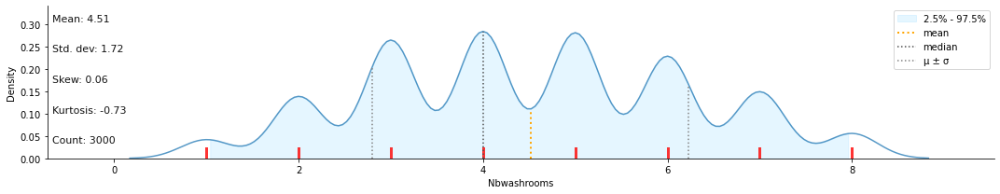

...

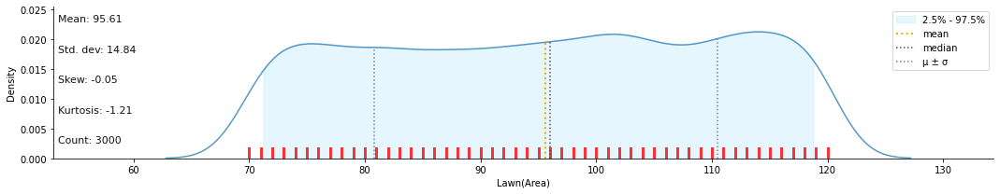

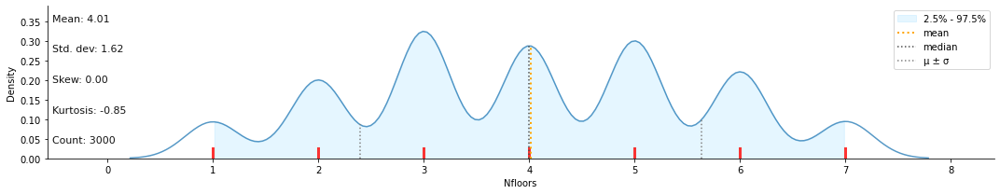

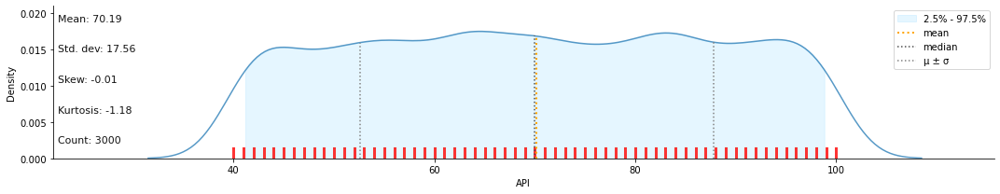

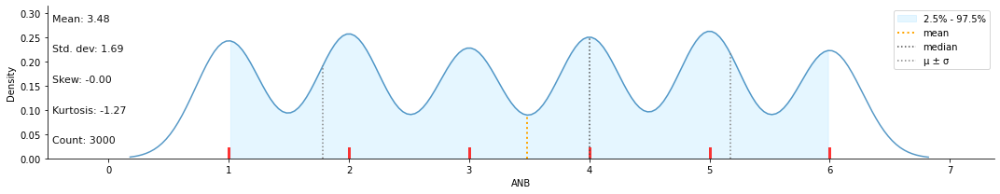

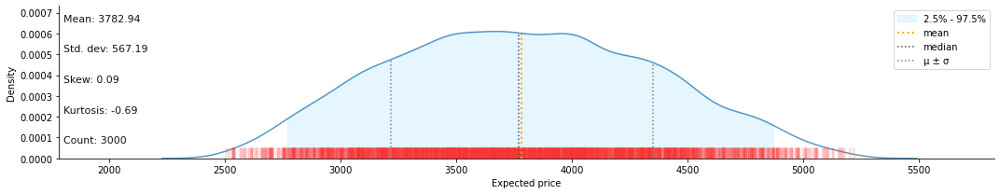

In [12]:
klib.dist_plot(df) # returns a distribution plot for every numeric feature

In [13]:
klib.missingval_plot(df) # returns a figure containing information about missing values

No missing values found in the dataset.


# Data Cleaning using Klib Library

In [14]:
# klib.clean - functions for cleaning datasets
klib.data_cleaning(df) # performs datacleaning (drop duplicates & empty rows/cols, adjust dtypes,...)


Shape of cleaned data: (3000, 14) - Remaining NAs: 0


Dropped rows: 0
     of which 0 duplicates. (Rows (first 150 shown): [])

Dropped columns: 0
     of which 0 single valued.     Columns: []
Dropped missing values: 0
Reduced memory by at least: 0.27 MB (-84.38%)



,id,area_total,trooms,nbedrooms,nbwashrooms,twashrooms,roof,roof_area,lawn_area,nfloors,api,anb,expected_price,grade
0,1,339,6,5,4,6,NO,0,76,2,79,6,3481,D
1,2,358,5,4,3,4,YES,71,96,3,72,4,3510,D
2,3,324,7,5,4,5,YES,101,117,5,64,3,3748,C
3,4,330,6,4,3,5,YES,101,82,2,59,2,3134,D
4,5,320,7,4,4,5,NO,0,75,3,40,1,3843,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,2996,341,9,6,5,7,YES,95,115,5,90,2,4246,B
2996,2997,292,9,8,7,8,YES,116,87,7,97,4,3753,A
2997,2998,328,7,4,3,5,NO,0,78,5,95,6,3607,D
2998,2999,293,9,7,7,8,NO,0,78,7,51,3,4198,B


In [15]:
klib.clean_column_names(df) # cleans and standardizes column names, also called inside data_cleaning()

,id,area_total,trooms,nbedrooms,nbwashrooms,twashrooms,roof,roof_area,lawn_area,nfloors,api,anb,expected_price,grade
0,1,339,6,5,4,6,NO,0,76,2,79,6,3481,D
1,2,358,5,4,3,4,YES,71,96,3,72,4,3510,D
2,3,324,7,5,4,5,YES,101,117,5,64,3,3748,C
3,4,330,6,4,3,5,YES,101,82,2,59,2,3134,D
4,5,320,7,4,4,5,NO,0,75,3,40,1,3843,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,2996,341,9,6,5,7,YES,95,115,5,90,2,4246,B
2996,2997,292,9,8,7,8,YES,116,87,7,97,4,3753,A
2997,2998,328,7,4,3,5,NO,0,78,5,95,6,3607,D
2998,2999,293,9,7,7,8,NO,0,78,7,51,3,4198,B


In [16]:
df=klib.convert_datatypes(df) # converts existing to more efficient dtypes, also called inside data_cleaning()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   id              3000 non-null   int16   
 1   area_total      3000 non-null   int16   
 2   trooms          3000 non-null   int8    
 3   nbedrooms       3000 non-null   int8    
 4   nbwashrooms     3000 non-null   int8    
 5   twashrooms      3000 non-null   int8    
 6   roof            3000 non-null   category
 7   roof_area       3000 non-null   int8    
 8   lawn_area       3000 non-null   int8    
 9   nfloors         3000 non-null   int8    
 10  api             3000 non-null   int8    
 11  anb             3000 non-null   int8    
 12  expected_price  3000 non-null   int16   
 13  grade           3000 non-null   category
dtypes: category(2), int16(3), int8(9)
memory usage: 50.3 KB


In [17]:
klib.mv_col_handling(df)

,id,area_total,trooms,nbedrooms,nbwashrooms,twashrooms,roof,roof_area,lawn_area,nfloors,api,anb,expected_price,grade
0,1,339,6,5,4,6,NO,0,76,2,79,6,3481,D
1,2,358,5,4,3,4,YES,71,96,3,72,4,3510,D
2,3,324,7,5,4,5,YES,101,117,5,64,3,3748,C
3,4,330,6,4,3,5,YES,101,82,2,59,2,3134,D
4,5,320,7,4,4,5,NO,0,75,3,40,1,3843,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,2996,341,9,6,5,7,YES,95,115,5,90,2,4246,B
2996,2997,292,9,8,7,8,YES,116,87,7,97,4,3753,A
2997,2998,328,7,4,3,5,NO,0,78,5,95,6,3607,D
2998,2999,293,9,7,7,8,NO,0,78,7,51,3,4198,B


## Label Encoding

In [18]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [19]:
df['roof']= le.fit_transform(df['roof'])
df['grade']= le.fit_transform(df['grade'])

In [20]:
df

,id,area_total,trooms,nbedrooms,nbwashrooms,twashrooms,roof,roof_area,lawn_area,nfloors,api,anb,expected_price,grade
0,1,339,6,5,4,6,0,0,76,2,79,6,3481,3
1,2,358,5,4,3,4,1,71,96,3,72,4,3510,3
2,3,324,7,5,4,5,1,101,117,5,64,3,3748,2
3,4,330,6,4,3,5,1,101,82,2,59,2,3134,3
4,5,320,7,4,4,5,0,0,75,3,40,1,3843,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,2996,341,9,6,5,7,1,95,115,5,90,2,4246,1
2996,2997,292,9,8,7,8,1,116,87,7,97,4,3753,0
2997,2998,328,7,4,3,5,0,0,78,5,95,6,3607,3
2998,2999,293,9,7,7,8,0,0,78,7,51,3,4198,1


In [21]:
klib.corr_mat(df) # returns a color-encoded correlation matrix

,id,area_total,trooms,nbedrooms,nbwashrooms,twashrooms,roof,roof_area,lawn_area,nfloors,api,anb,expected_price,grade
id,1.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.01,-0.01,-0.00,-0.01,0.01,-0.01
area_total,0.00,1.00,0.02,0.03,0.03,0.04,0.01,0.02,-0.00,0.02,-0.00,-0.01,0.27,-0.18
trooms,0.00,0.02,1.00,0.87,0.83,0.79,0.03,0.03,0.01,0.86,0.01,0.01,0.82,-0.88
nbedrooms,0.00,0.03,0.87,1.00,0.96,0.92,0.02,0.03,0.00,0.74,0.00,0.02,0.72,-0.87
nbwashrooms,0.00,0.03,0.83,0.96,1.00,0.96,0.03,0.03,0.01,0.71,0.01,0.01,0.68,-0.85
twashrooms,0.00,0.04,0.79,0.92,0.96,1.00,0.03,0.03,0.01,0.68,0.01,0.02,0.65,-0.82
roof,0.01,0.01,0.03,0.02,0.03,0.03,1.00,0.98,-0.00,0.01,-0.01,-0.02,0.01,-0.17
roof_area,0.01,0.02,0.03,0.03,0.03,0.03,0.98,1.00,-0.01,0.01,-0.01,-0.02,0.01,-0.17
lawn_area,0.01,-0.00,0.01,0.00,0.01,0.01,-0.00,-0.01,1.00,0.01,0.01,0.03,0.01,-0.05
nfloors,-0.01,0.02,0.86,0.74,0.71,0.68,0.01,0.01,0.01,1.00,-0.00,0.02,0.71,-0.79


<AxesSubplot:title={'center':'Feature-correlation (pearson)'}>

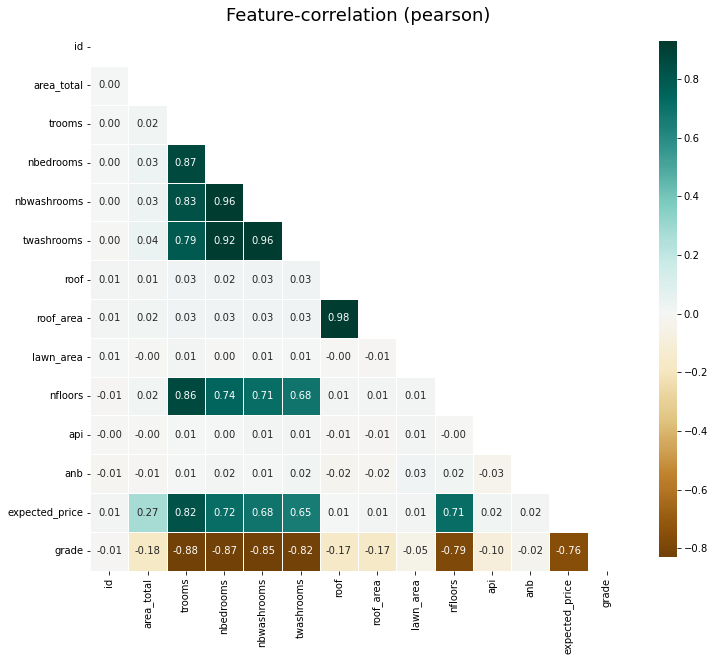

In [22]:
klib.corr_plot(df)

# visualization 

### Grade Dsitribution

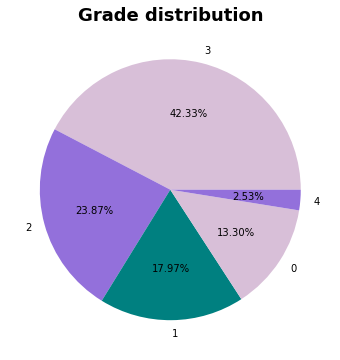

In [24]:
plt.figure(figsize=(15,6))
percentage = df['grade'].value_counts()         
labels = list(df['grade'].value_counts().index)
color = ['thistle','mediumpurple','teal']
plt.pie(percentage,labels = labels, autopct= "%0.2f%%",colors=color)
plt.title('Grade distribution',fontweight='bold',fontsize=18)
plt.show()

#### Interpretation ::::
from this pie plot we can say that highest rooms are from grade 3 and grade 4 have the least.

### Grade wise Expected Price    and           Grade wise Trooms

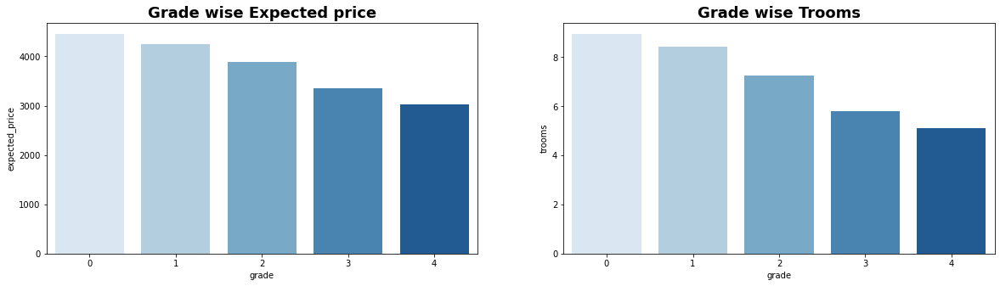

In [27]:
plt.figure(figsize =(20,5))

plt.subplot(1,2,1)
plt.title("Grade wise Expected price",fontweight='bold',fontsize=18)
sns.barplot(y=df['expected_price'], x=df['grade'],palette='Blues',ci=None)

plt.subplot(1,2,2)
plt.title("Grade wise Trooms",fontweight='bold',fontsize=18)
sns.barplot(x=df['grade'], y=df['trooms'],palette='Blues',ci=None)

plt.show()

#### Interpetation ::::
By first graph we can say that 0 grade have the highest price , and 4 have the least , but people who want a afordable house with some good fecilities, can be showed with grade 2 houses ,as we can in plot two grade 2 have enogh(6-7) number of rooms with afordable price.


### Grade wise Lawn Area and Grade Wise roof area

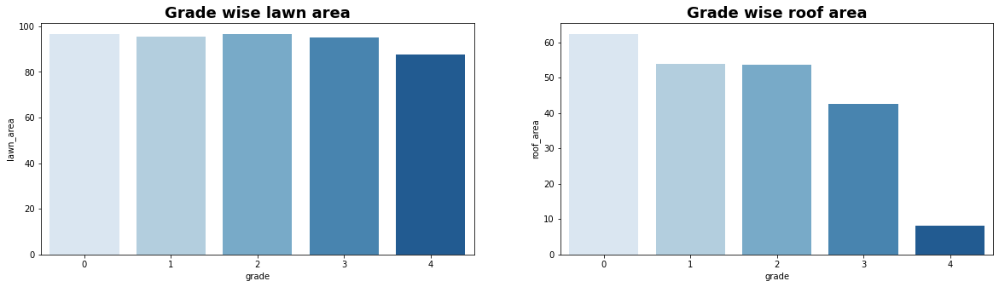

In [73]:
plt.figure(figsize =(20,5))

plt.subplot(1,2,1)
plt.title("Grade wise lawn area",fontweight='bold',fontsize=18)
sns.barplot(y=df['lawn_area'], x=df['grade'],palette='Blues',ci=None)

plt.subplot(1,2,2)
plt.title("Grade wise roof area",fontweight='bold',fontsize=18)
sns.barplot(x=df['grade'], y=df['roof_area'],palette='Blues',ci=None)

plt.show()

#### Interpertation ::::
if one want lawn area then can go with grade 0,1,2 also if one want more roof area then can go with grade 0 and 1 , but as we know expected price will increase with increasing grade so if one want a minimum good roof area then can go with grade 3 house where roof area is good enough , but for big lawn area one must pay more .


### Number of nbedroom acc to grade

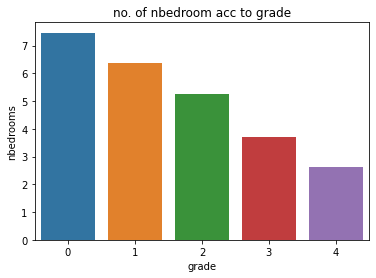

In [67]:
sb.barplot(x=df["grade"],y=df["nbedrooms"],ci=None)
plt.title("no. of nbedroom acc to grade")
plt.show()

#### Interpretation ::::
Number of bedrooms are highest in grade 0 and least with 0 grade , customer with small family can be suggested with grade 3 and 4 also if budget is less then , and if customer is with big family then grade 1 and 2 will be more better but as grade will increase expected price will also increase.

### Grade vs Area

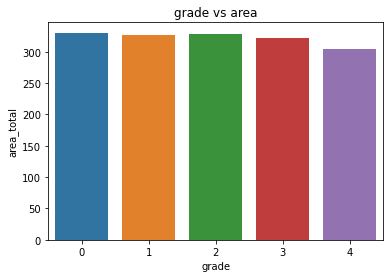

In [70]:
sb.barplot(x=df["grade"],y=df["area_total"],ci=None)
plt.title("grade vs area")
plt.show()

### Interprtation ::::
we can see that area is not very much affecting the grade .

### Price acc to floor and Grade Acc to nfloors

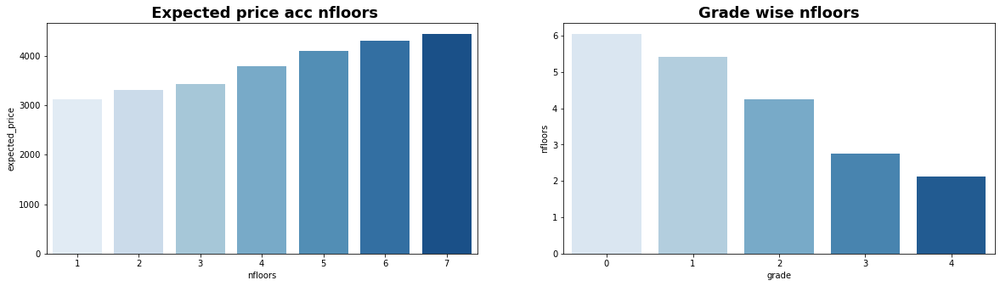

In [36]:
plt.figure(figsize =(20,5))

plt.subplot(1,2,1)
plt.title(" Expected price acc nfloors",fontweight='bold',fontsize=18)
sns.barplot(y=df['expected_price'], x=df['nfloors'],palette='Blues',ci=None)

plt.subplot(1,2,2)
plt.title("Grade wise nfloors",fontweight='bold',fontsize=18)
sns.barplot(x=df['grade'], y=df['nfloors'],palette='Blues',ci=None)

plt.show()

#### Interpretation ::::
from the above plot we can say that as number of floor is increasing expected price and grade is also increasing.

####  twashrooms v/s expected_price v/s Grade

Text(0.5, 1.0, 'twashrooms v/s expected_price v/s Grade')

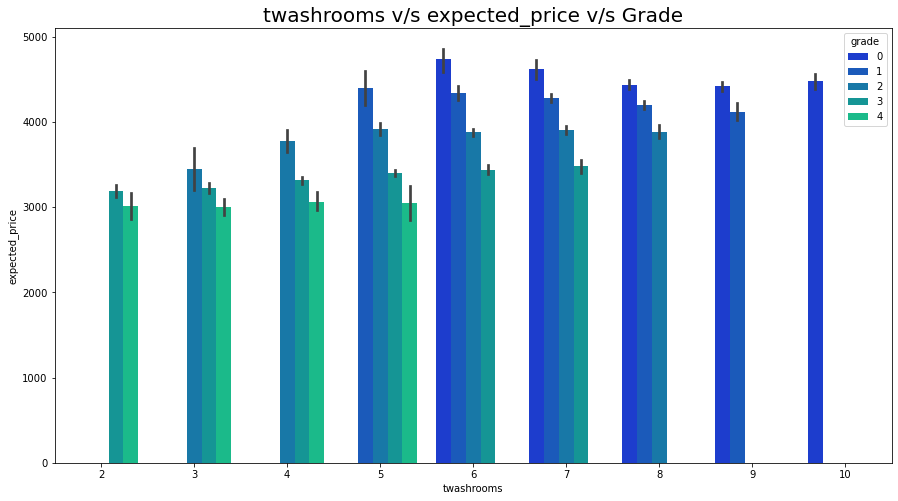

In [69]:
plt.figure(figsize = (15,8))
sns.barplot(x = df["twashrooms"], y=df["expected_price"], hue = df["grade"], palette = "winter")
plt.title("twashrooms v/s expected_price v/s Grade" , fontsize = 20)

### Interpretation ::::
from above graph i can say that with 2,3,4 number of washroom price is comparitivly less and as number of washroom is increasing expected price is also increasing.

# Splitting our data into train and test

In [46]:
import numpy as np

In [47]:
x= np.array(df.drop(columns='grade', axis =1))
y= np.array(df['grade'])

In [48]:
x

array([[   1,  339,    6, ...,   79,    6, 3481],
       [   2,  358,    5, ...,   72,    4, 3510],
       [   3,  324,    7, ...,   64,    3, 3748],
       ...,
       [2998,  328,    7, ...,   95,    6, 3607],
       [2999,  293,    9, ...,   51,    3, 4198],
       [3000,  343,    7, ...,   95,    3, 4105]], dtype=int32)

In [49]:
y

array([3, 3, 2, ..., 3, 1, 2])

# 1) Logistic model

In [50]:
# define lists to gather results for plotting later
results, names = list(), list()

In [51]:
# Import Required Modules.
from statistics import mean, stdev
from sklearn import preprocessing
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn import linear_model
from sklearn import datasets

from sklearn.model_selection import RepeatedStratifiedKFold

In [52]:
# define the model
model1 = linear_model.LogisticRegression()

# evaluate the model
cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=2, random_state=42)
n_scores = cross_val_score(model1, x, y, scoring='f1_weighted', cv=cv, n_jobs=-1, error_score='raise')

results.append(n_scores)
names.append('cart')

# report performance
a1 = mean(n_scores)
a1

0.5165965481385457

# 2) Decision Tree Classifier

In [53]:
from sklearn.tree import DecisionTreeClassifier
# evaluation imports
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from numpy import mean ,std

In [54]:
# define lists to gather results for plotting later
results, names = list(), list()

In [55]:
# define the model
model2 = DecisionTreeClassifier()

# evaluate the model
cv = RepeatedStratifiedKFold(n_splits=3, n_repeats=2, random_state=42)
n_scores = cross_val_score(model2, x, y, scoring='f1_weighted', cv=cv, n_jobs=-1, error_score='raise')

results.append(n_scores)
names.append('cart')

# report performance
a2 = mean(n_scores)
a2

0.821892189706257

# 3)Bagging with Random Forest with statified K fold

In [56]:
from sklearn.ensemble import RandomForestClassifier

In [57]:
# define the model
model3 = RandomForestClassifier()

# evaluate the model
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores = cross_val_score(model3, x,y, scoring='f1_weighted', cv=cv, n_jobs=-1, error_score='raise')

results.append(n_scores)
names.append('rf')

# report performance
a3 = n_scores.mean()
a3 

0.8976454089091779

#  4Boosting with Adaboost

In [58]:
from sklearn.ensemble import AdaBoostClassifier

In [59]:
# define the model
model4 = AdaBoostClassifier()

# evaluate the model
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
n_scores = cross_val_score(model4, x,y, scoring='f1_weighted', cv=cv, n_jobs=-1, error_score='raise')

results.append(n_scores)
names.append('ada')

# report performance
a4 = n_scores.mean()
a4

0.5743818306660865

# 4)Stacking

In [60]:
# required Python libraries
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import StackingClassifier

In [61]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import StackingClassifier

In [62]:
def get_stacking():
    lovel0 = list()
    level0.append(("model1",LogisticRegression()))
    level0.append(("model2",DecisionTreeClassifier()))
    level0.append(("model3",RandomForestClassifier()))
    level0.append(("model4",AdaBoostClassifier()))
    
    level1 = LogisticRegression()
    model = StackingClassifier(estimators = level0,final_estimator = level1,cv = 5)
    return model

# Plot for Final Comparison

In [63]:
result = pd.DataFrame({"model":
    ["baselinge decision tree classifier","bagging with random forest with kfold",
     "adaaboost with kfold","stacking"],
                       "score":
                       [a1,a2,a3,a4]
})

In [64]:
result

,model,score
0,baselinge decision tree classifier,0.516597
1,bagging with random forest with kfold,0.821892
2,adaaboost with kfold,0.897645
3,stacking,0.574382


#### FINAL INTERPRTATION ::::
##### Bussiness Analysis :::
we can suggest grade 3 and 4 to the people who are having small family also want house with afordable price .

people who are not having any budget issue and want to live with more comfert can be suggested  with grade 1 and 2 .

##### Model selection for predictions ::::
After making 4 models i will choose adaaboost with kfold method model for future prdictions of grade of the house which is giving me the highest accuracy score.
